[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/MaxMitre/DeepLearning/blob/main/Semana02_Thompson_Sampling.ipynb)

# Thompson Sampling Algorithm

In [ ]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import random
import scipy.stats as ss

%matplotlib inline
from matplotlib.animation import FuncAnimation

from IPython.core.pylabtools import figsize

# matplotlib setup
figsize(7.0, 6)
x = np.linspace(0.0,16.0,200)

See this for more details: https://en.wikipedia.org/wiki/Conjugate_prior

## 1. Thompson Sampling for binomial distributed Revenues with beta apriori



###Data and Strategies

In [ ]:
N = 10000   # number of rounds - customer visiting web page with Ad
d = 9       # number of strategies

In [ ]:
conversion_rates = [0.05,0.13,0.09,0.16,0.11,0.04,0.20,0.08,0.01]

In [ ]:
# Create the reward matrix (num of rounds x result for each strategy)
np.random.seed(4)
rewards = np.zeros((N,d))
# populate matrix according to the conversion rates
for i in range(N):
    for j in range(d):
        if np.random.rand() <= conversion_rates[j]:   # np.random.rand(d0, d1, ..., dn) returns Random values [0,1[ in a given shape d0xd1x...
            rewards[i,j] = 1

In [ ]:
print(rewards)
print(rewards.shape)

[[0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 [1. 0. 0. ... 1. 1. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
(10000, 9)


Beta Distribution

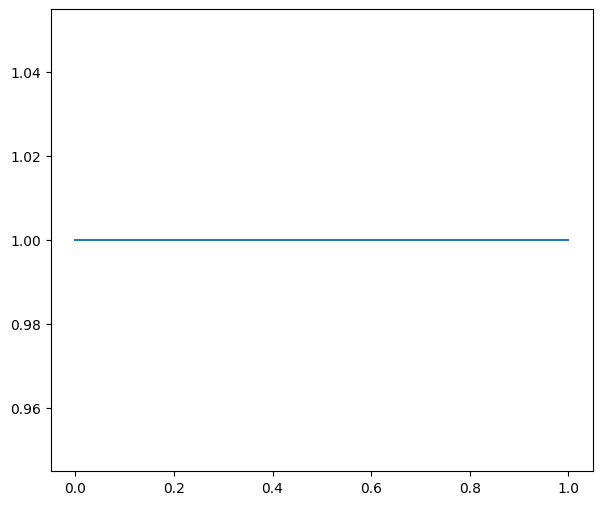

In [ ]:
xaux = np.linspace(0,1,100)
yaux = ss.beta.pdf(xaux,1,1)
plt.plot(xaux,yaux)
plt.show()

In [ ]:
ss.beta.rvs(1,1)

0.6004113653278238

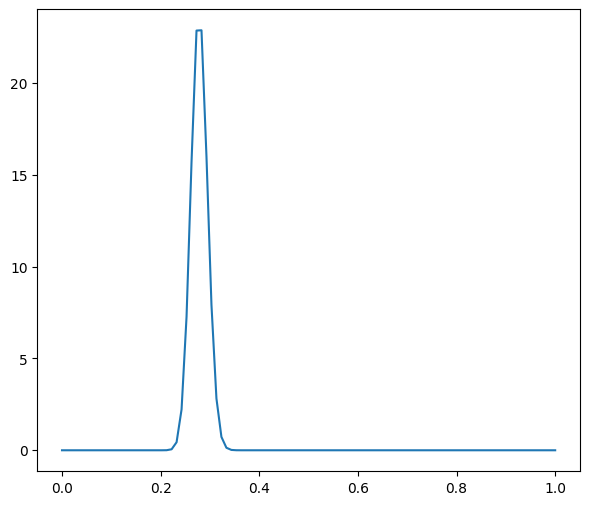

In [ ]:
xaux = np.linspace(0,1,100)
yaux = ss.beta.pdf(xaux,1+200,1+520)
plt.plot(xaux,yaux)
plt.show()

In [ ]:
ss.beta.rvs(201,521)

0.2774321770944304

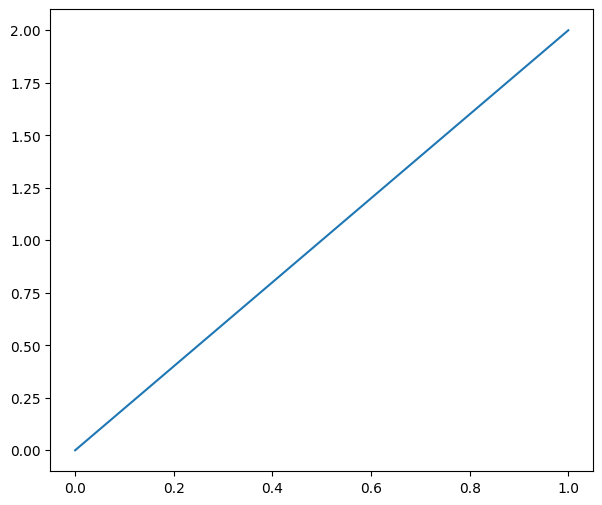

In [ ]:
xaux = np.linspace(0,1,100)
yaux = ss.beta.pdf(xaux,1+1,1)   # (alfa aumenta si hay exito, beta disminuye si hay fracaso)
plt.plot(xaux,yaux)
plt.show()

In [ ]:
ss.beta.rvs(2,1)

0.24197331074282263

# Ejercicio: ¿Como funciona el algoritmo?


In [ ]:
[ss.beta.rvs(1,1), ss.beta.rvs(1,1), ss.beta.rvs(1,1)]

[0.8344217495121965, 0.7785471646884548, 0.291817733972346]

In [ ]:
# llevan a cabo la bernoulli       [0.05, 0.13, 0.09]

In [ ]:
[ss.beta.rvs(1,1+1), ss.beta.rvs(1,1), ss.beta.rvs(1,1)]

[0.07965084608678115, 0.8509597640366683, 0.509457069337946]

semilla aleatoria

In [ ]:
np.random.seed(1)

In [ ]:
np.random.rand()

0.417022004702574

In [ ]:
np.random.rand()

0.7203244934421581

In [ ]:
np.random.rand()

0.00011437481734488664

###Implement random strategy and Thompson Sampling for comparison

In [ ]:
selected_strategies_random = []
selected_strategies_thompson = []
total_rewards_random = 0
total_rewards_thompson = 0
numbers_of_rewards_1 = np.zeros(d)
numbers_of_rewards_0 = np.zeros(d)
reward_per_strategy = np.zeros(d)
regret_curve_random = []
regret_curve_thompson = []

for n in range(N):

    # Random strategy
    selected_strategy_random = random.randrange(d)
    selected_strategies_random.append(selected_strategy_random)
    total_rewards_random += rewards[n,selected_strategy_random]

    # Thompson Sampling Strategy
    max_random_beta = 0
    startegy_with_max_beta = 0
    random_beta = np.zeros(d)

    # for each strategy, random draw from beta distribution with 2 parameters then select highest
    for i in range(d):
        random_beta[i] = ss.beta.rvs(numbers_of_rewards_1[i]+1, numbers_of_rewards_0[i]+1) # return value in range 0,1
        startegy_with_max_beta_draw = np.argmax(random_beta)
        max_random_beta = random_beta[startegy_with_max_beta_draw]

    # Update Beta distribution parameters of selected strategy
    if rewards[n,startegy_with_max_beta_draw]==1:
        numbers_of_rewards_1[startegy_with_max_beta_draw]+=1
    else:
        numbers_of_rewards_0[startegy_with_max_beta_draw]+=1

  # Update Thompson sampling strategy KPIs
    selected_strategies_thompson.append(startegy_with_max_beta_draw)
    total_rewards_thompson += rewards[n,startegy_with_max_beta_draw]

    # Score per strategy
    for i in range(d):
        reward_per_strategy[i] += rewards[n, i]

    # Regret as the difference between slected strategy and best strategy
    regret = max(reward_per_strategy) - total_rewards_random
    regret_curve_random.append(regret)
    regret = max(reward_per_strategy) - total_rewards_thompson
    regret_curve_thompson.append(regret)

###Measure performance


In [ ]:
# Computing the Absolute and Relative Return
# in absolute monetary value assuming 1K€ extra revenue for each premium plan
absolute_return = (total_rewards_thompson - total_rewards_random)
# profit increase in % vs random strategy
relative_return = (total_rewards_thompson - total_rewards_random) / total_rewards_random * 100

In [ ]:
print(f'Performance achieved over {N} samples and the assumed strategy conversion rate:')
print('Absolute return: {:.0f}K€ extra profits'.format(absolute_return))
print('Relative return: {:.0f} % profit increase'.format(relative_return))

Performance achieved over 10000 samples and the assumed strategy conversion rate:
Absolute return: 907K€ extra profits
Relative return: 92 % profit increase


###Plot histogram of selected strategies

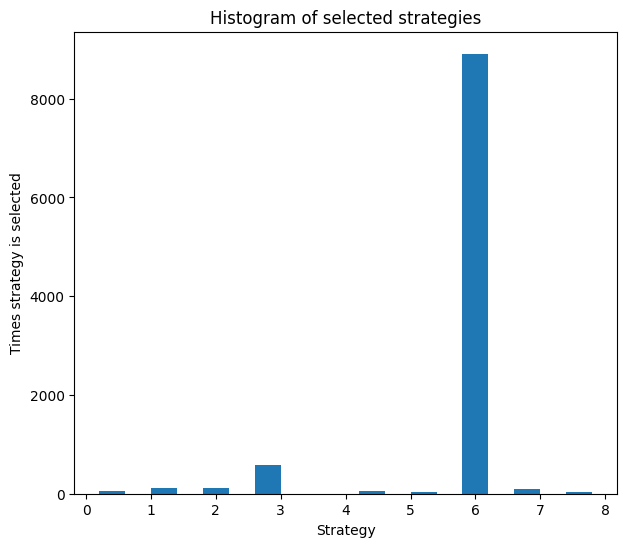

In [ ]:
plt.hist(selected_strategies_thompson, align='mid', rwidth=0.5)
plt.title('Histogram of selected strategies')
plt.xlabel('Strategy')
plt.ylabel('Times strategy is selected')
plt.show()

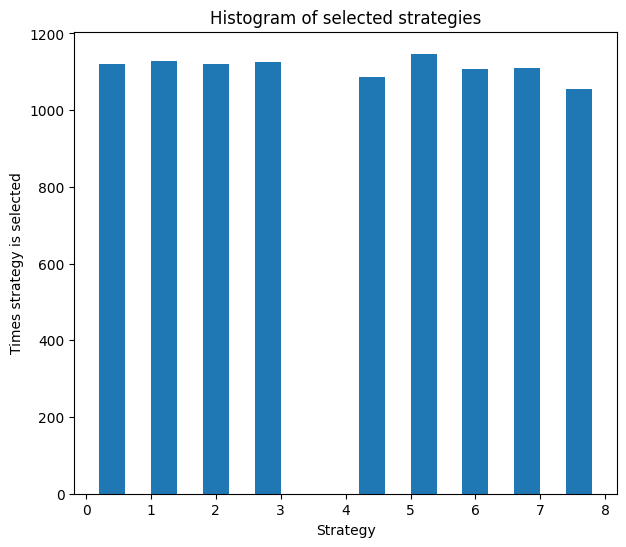

In [ ]:
plt.hist(selected_strategies_random, align='mid', rwidth=0.5)
plt.title('Histogram of selected strategies')
plt.xlabel('Strategy')
plt.ylabel('Times strategy is selected')
plt.show()

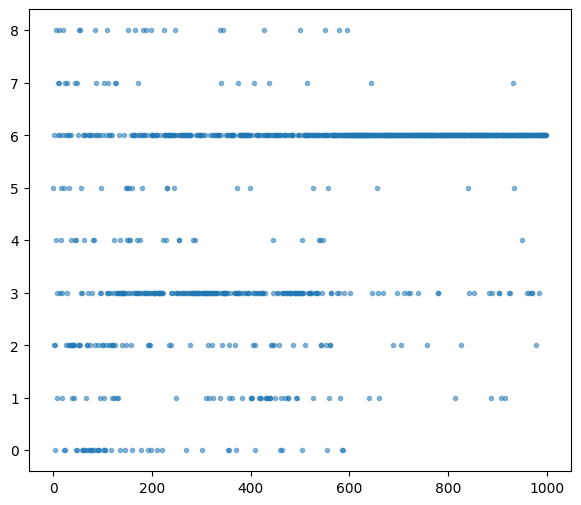

In [ ]:
figure = plt.scatter(range(1000), selected_strategies_thompson[:1000], marker='.', alpha=0.5)

In [ ]:
def plot_scatter(k):
    plt.scatter(range(10*k,10*k+10), selected_strategies_thompson[10*k:10*k+10], marker='.', c='b', alpha=0.5)

In [ ]:
# initialize a writer which uses ffmpeg and records at 20 fps with a bitrate of 1800
import matplotlib.animation as animation
Writer = animation.writers['ffmpeg']
writer = Writer(fps=5, metadata=dict(artist='Me'), bitrate=1800)

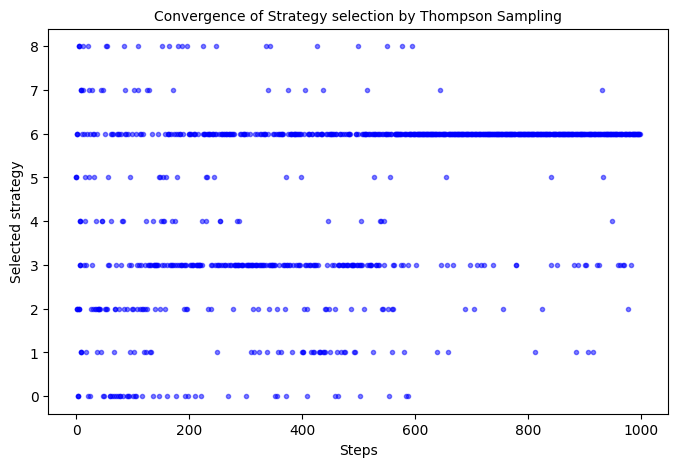

In [ ]:
fig = plt.figure(figsize=(8,5))
plt.xlabel('Steps',fontsize=10)
plt.title('Convergence of Strategy selection by Thompson Sampling',fontsize=10)
plt.ylabel('Selected strategy',fontsize=10)
ani = matplotlib.animation.FuncAnimation(fig, plot_scatter, frames=100, repeat=True)
#plt.show()
ani.save('thompsonsampling.mp4', writer=writer)

###Regret curves

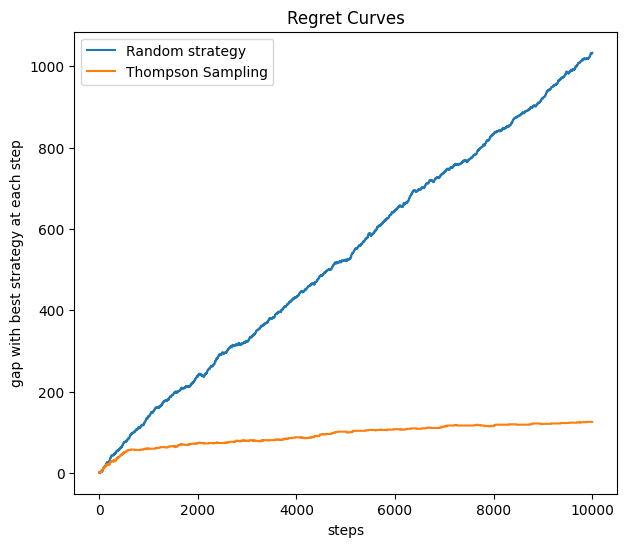

In [ ]:
plt.plot(regret_curve_random, label='Random strategy')
plt.plot(regret_curve_thompson, label='Thompson Sampling')
plt.title('Regret Curves')
plt.legend(loc='upper left')
plt.xlabel('steps')
plt.ylabel('gap with best strategy at each step')
plt.show()

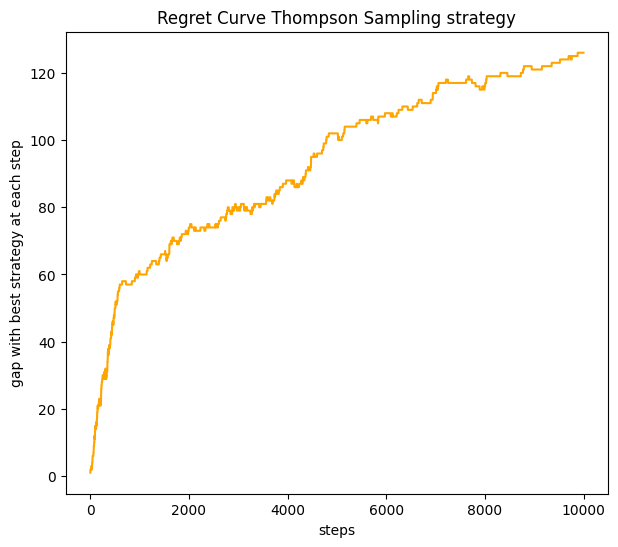

In [ ]:
plt.plot(range(N), regret_curve_thompson, color='orange')
plt.title('Regret Curve Thompson Sampling strategy')
plt.xlabel('steps')
plt.ylabel('gap with best strategy at each step')
plt.show()

## 2. Thompson Sampling for normally distributed Revenues with variance known with normal apriori

Now, we can consider a Revenues such that $X \sim N(\mu,σ^2)$ and normal distribution for apriori.

###Data and Strategies

In [ ]:
socket_true_values = [6, 10, 8, 12, 11]
socket_variance = [2,5,3,1,6]

print(f"True Values = {socket_true_values}")
print(f"Variances = {socket_variance}")

True Values = [6, 10, 8, 12, 11]
Variances = [2, 5, 3, 1, 6]


###Implement Thompson Sampling

In [ ]:
class UnknownMeanUnknownVariance:

    def __init__(self, μ, v):
      self.μ = μ   # the true mean
      self.v = v   # the true variance

      self.n = 0   # the number of times this socket has been tried
      self.x = []  # list of all samples

      self.α = 1   # gamma shape parameter
      self.β = 10  # gamma rate parameter

      self.μ_0 = 1 # the prior (estimated) mean
      self.v_0 = self.β / (self.α + 1) # the prior (estimated) variance

    def update(self,x):
      ''' increase the number of times this socket has been used and improve the estimate of the
          mean and variance by combining the single new value 'x' with the current estimate '''
      n = 1
      v = self.n

      self.α = self.α + n/2
      self.β = self.β + ((n*v/(v + n)) * (((x - self.μ_0)**2)/2))

      # estimate the variance - calculate the mean from the gamma hyper-parameters
      self.v_0 = self.β / (self.α + 1)

      self.x.append(x)  # append the new value to the list of samples
      self.n += 1
      self.μ_0 = np.array(self.x).mean()

    def charge(self):
      ''' return a value using the true mean and variance for the socket '''
      value = np.random.normal( self.μ, np.sqrt(self.v) )

      # never allow a charge less than 0 to be returned
      return 0 if value < 0 else value

    def sample(self):
      ''' sample from our estimated normal '''

      precision = np.random.gamma(self.α, 1/self.β)
      if precision == 0 or self.n == 0: precision = 0.001

      estimated_variance = 1/precision
      return np.random.normal( self.μ_0, np.sqrt(estimated_variance))

In [ ]:
def plot_socket_pdfs(sockets):

  ymax = 0
  for index, socket in enumerate(sockets):

    # get the PDF of the socket using its true values
    y = ss.norm.pdf( x, socket.μ, np.sqrt(socket.v))

    p = plt.plot(x, y, lw=2, label = f"{index}" )
    c = p[0].get_markeredgecolor()
    plt.fill_between(x, y, 0, color=c, alpha=0.2 )
    plt.legend()
    plt.autoscale(tight=True)

    plt.vlines(socket.μ, 0, y[1:].max(), colors = c, linestyles = "--", lw = 2)

    ymax = max( ymax, y[1:].max()*1.05 )

  axes = plt.gca()
  axes.set_ylim([0,ymax])

  plt.legend(title = 'Sockets')
  plt.title('Density Plot of Socket Outputs')
  plt.xlabel('Socket Output (seconds of charge)')
  plt.ylabel('Density')


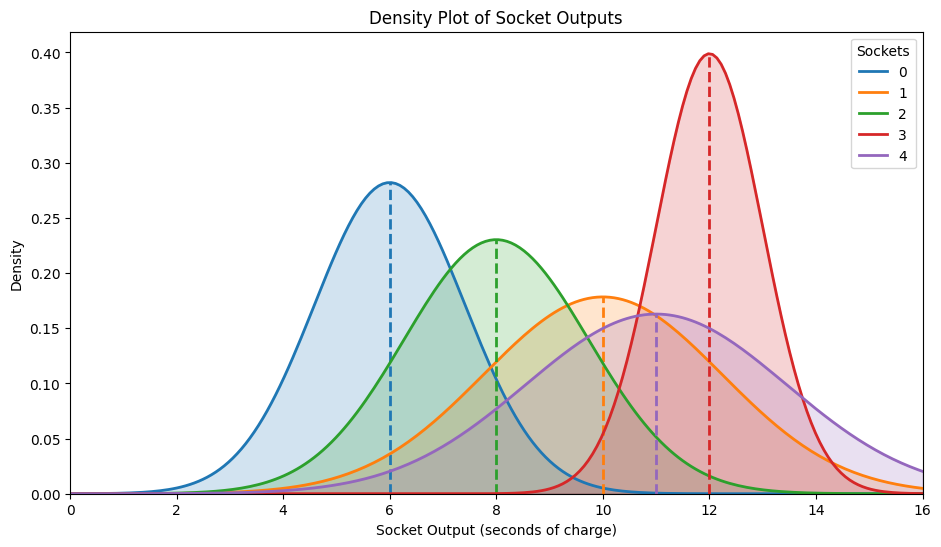

In [ ]:
# create the sockets
sockets = [ UnknownMeanUnknownVariance(m,v) for (m, v) in zip(socket_true_values, socket_variance)]

figsize(11.0, 6)
plot_socket_pdfs( sockets )
#plt.savefig("unknown_mean_unknown_variance_pdf.png",bbox_inches='tight')

In [ ]:
def random_argmax(value_list):
  """ a random tie-breaking argmax"""
  values = np.asarray(value_list)
  return np.argmax(np.random.random(values.shape) * (values==values.max()))

In [ ]:
def plot_sockets(sockets, socket_probabilities ):

  trials = sum([socket.n for socket in sockets])
  plt.title(f"{trials} Trials")

  ymax = 0
  for index, socket in enumerate(sockets):

    # get the PDF of the socket using its estimates
    y = ss.norm.pdf( x, socket.μ_0, np.sqrt(socket.v_0) )

    p = plt.plot(x, y, lw=2, label = f'{socket.n}/{trials}')
    c = p[0].get_markeredgecolor()
    plt.fill_between(x, y, 0, color=c, alpha=0.2 )
    plt.legend()
    plt.autoscale(tight=True)

    plt.vlines(socket.μ_0, 0, y[1:].max(), colors = c, linestyles = "--", lw = 2)

    ymax = max( ymax, y[1:].max()*1.05 )

  axes = plt.gca()
  axes.set_ylim([0,ymax])

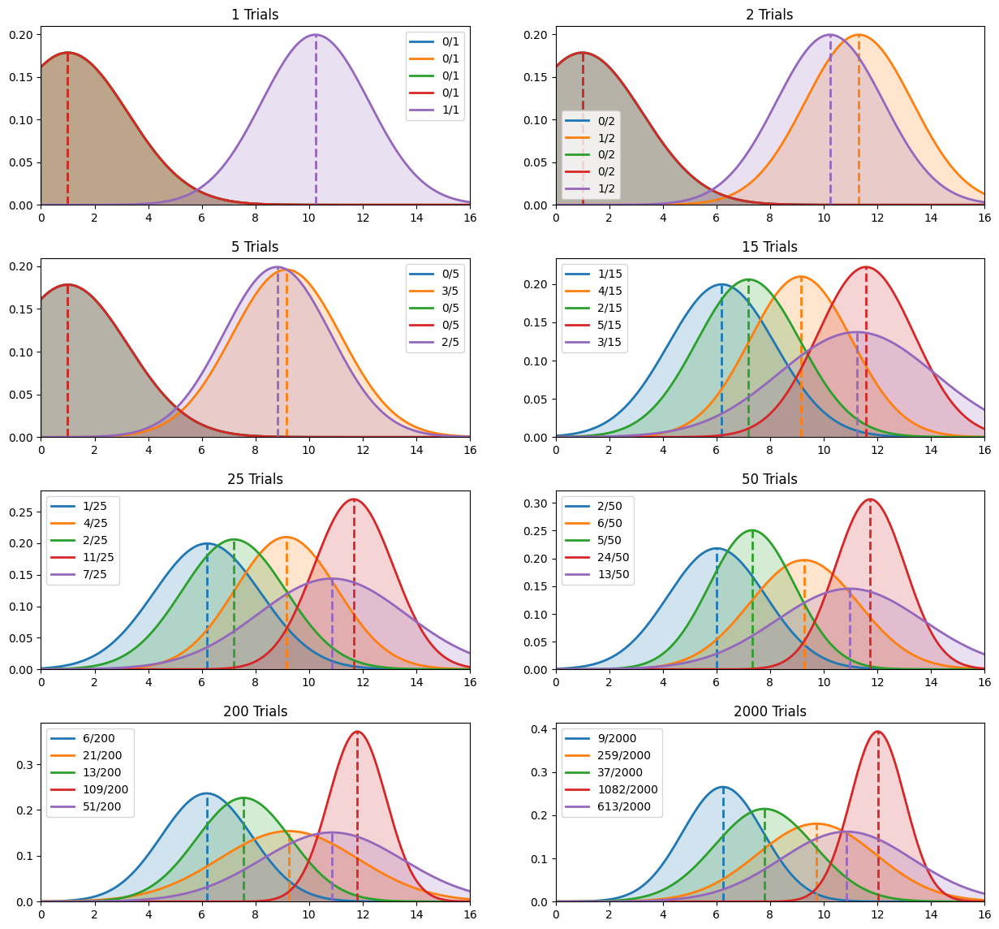

In [ ]:
%matplotlib inline
sockets = [ UnknownMeanUnknownVariance(m,v) for (m, v) in zip(socket_true_values, socket_variance)]

draw_samples = [1, 1, 3, 10, 10, 25, 150, 1800]
x = np.linspace(0.0,16.0,200)

figsize(15.0, 14)
for j,i in enumerate(draw_samples):
  plt.subplot(4, 2, j+1)
  plt.subplots_adjust(hspace = 0.3)

  for k in range(i):
    # choose the socket with the current highest sampled value or arbitrary select a socket in the case of a tie
    socket_samples = [socket.sample() for socket in sockets]
    socket_index = random_argmax(socket_samples)

    # charge from the chosen socket and update its mean reward value
    reward = sockets[socket_index].charge()
    sockets[socket_index].update(reward)

  plot_sockets(sockets, socket_true_values)

# plt.savefig("Images/thompson_unknown_mean_unknown_variance.png",bbox_inches='tight')

In [ ]:
%%capture
# stop the initial figure from being shown

from IPython.display import HTML


x = np.linspace(0.0,18.0,200)

# setup the axis of the figure
figsize(11.0, 6)
fig = plt.figure()
ax = plt.axes(xlim=(2, 16), ylim=(0, 0.5))

plt.title('Density Plot of Socket Outputs')
plt.xlabel('Socket Output (seconds of charge)')
plt.ylabel('Density')

# define a text list for the legend - standard legends dont work well with animation
texts = [ax.text(0.88, 0.95-i*0.05,  '', transform=ax.transAxes) for i in range(len(sockets)+2)]
texts[1].set_text('sockets:')

lines = []
for index in range(len(sockets)):
  lobj = ax.plot([],[],lw=2)[0]
  lines.append(lobj)


# animation initialisation
def init():
  for line in lines:
      line.set_data([],[])
  return lines


# animate function called at each step
def animate(i):

  # choose the socket with the current highest sampled value or arbitrary select a socket in the case of a tie
  socket_samples = [socket.sample() for socket in sockets]
  socket_index = random_argmax(socket_samples)

  # charge from the chosen socket and update its mean reward value
  reward = sockets[socket_index].charge()
  sockets[socket_index].update(reward)

  texts[0].set_text(f'trials: {i}')

  #ax.collections.clear()

  for artist in plt.gca().lines + plt.gca().collections:
    artist.remove()


  for index, socket in enumerate(sockets):

    y = ss.norm.pdf( x, socket.μ_0, np.sqrt(socket.v_0) )

    line = lines[index]
    line.set_data(x, y)
    texts[index+2].set_text(f'     {index}: {socket.n}')

    c = line.get_markeredgecolor()
    ax.fill_between(x, y, 0, color=c, alpha=0.2 )

    # add the coloured lines to the legend
    ax.hlines(y=0.431-index*0.0245, xmin=14.3, xmax=14.6, linewidth=3, color=c)

  return lines

In [ ]:
%matplotlib notebook
''' Run the test and show the results - this can take a while before the image is shown '''
sockets = [ UnknownMeanUnknownVariance(m,v) for (m, v) in zip(socket_true_values, socket_variance)]
anim = FuncAnimation(fig, animate, init_func=init, frames=100, interval=100, blit=True)
HTML(anim.to_jshtml())

# Referencias:
https://en.wikipedia.org/wiki/Conjugate_prior